In [1]:
import os
import gc
import random
import pickle
from pathlib import Path
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
tqdm.pandas()
from datetime import datetime, timedelta
from collections import Counter

from sklearn.metrics import roc_auc_score
from sklearn.model_selection import KFold, StratifiedKFold

import cudf
import cupy as cp

import lightgbm as lgb
import xgboost as xgb
from xgboost import dask as dxgb
from xgboost.dask import DaskDMatrix
import argparse
from cuml import ForestInference

import logging
import warnings
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)
pd.set_option('float_format', '{:f}'.format)
warnings.filterwarnings('ignore')

def load_pkl(path):
    with open(path, mode="rb") as f:
        data = pickle.load(f)
    return data

def reduce_mem_usage(df):
    start_mem = df.memory_usage().sum() / 1024 ** 2
    for i, col in enumerate(df.columns):
        try:
            col_type = df[col].dtype

            if col_type != object:
                c_min = df[col].min()
                c_max = df[col].max()
                if str(col_type)[:3] == 'int':
                    if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                        df[col] = df[col].astype(np.int8)
                    elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                        df[col] = df[col].astype(np.int16)
                    elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                        df[col] = df[col].astype(np.int32)
                    elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                        df[col] = df[col].astype(np.int32)
                else:
                    if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                        df[col] = df[col].astype(np.float32)
                    elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                        df[col] = df[col].astype(np.float32)
                    else:
                        df[col] = df[col].astype(np.float32)
        except ValueError:
            continue

    end_mem = df.memory_usage().sum() / 1024 ** 2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))

    return df

def apk(actual, predicted, k=10):
    if len(predicted)>k:
        predicted = predicted[:k]

    score = 0.0
    num_hits = 0.0

    for i,p in enumerate(predicted):
        if p in actual and p not in predicted[:i]:
            num_hits += 1.0
            score += num_hits / (i+1.0)

    if not actual:
        return 0.0

    return score / min(len(actual), k)

def mapk(actual, predicted, k=10):
    return np.mean([apk(a,p,k) for a,p in zip(actual, predicted)])

def apk_list(actual, predicted, k=10):
    return [apk(a,p,k) for a,p in zip(actual, predicted)]

In [2]:
INPUT_DIR = Path("../input/h-and-m-personalized-fashion-recommendations")

# transactions = pd.read_pickle(INPUT_DIR / "transactions_train_sample01.pkl")
transactions = pd.read_pickle(INPUT_DIR / "transactions_train_sample1.pkl")
# transactions = pd.read_pickle(INPUT_DIR / "transactions_train_sample5.pkl")
# transactions = pd.read_pickle(INPUT_DIR / "transactions_train_sample10.pkl")
# transactions = pd.read_pickle(INPUT_DIR / "transactions_train_sample20.pkl")
# transactions = pd.read_pickle(INPUT_DIR / "transactions_train.pkl")

latest = datetime(2020, 9, 22)
transactions["t_dat"] = pd.to_datetime(transactions["t_dat"])
transactions["diff_from_latest"] = (latest - transactions["t_dat"]).dt.days
transactions["week"] = (transactions["diff_from_latest"] // 7) + 1

article2id = load_pkl(INPUT_DIR / "article2id.pkl")
customer2id = load_pkl(INPUT_DIR / "customer2id.pkl")

id2artcle = {j:i for i,j in article2id.items()}

In [3]:
customers = pd.read_pickle(INPUT_DIR / "customers.pkl")

color_feat = pd.read_csv("../save/customer_perceived_colour_value_name_feat.csv")
index_feat = pd.read_csv("../save/customer_index_group_name_feat.csv")
age_group = pd.read_csv("../save/customer_age_gorup.csv")
user_segment_v1 = pd.read_csv("../save/customer_user_segment_v1.csv")

customers = customers.merge(color_feat, on="customer_id")
customers = customers.merge(index_feat, on="customer_id")
customers = customers.merge(age_group, on="age", how = "left")
customers = customers.merge(user_segment_v1, on="customer_id", how = "left")

In [4]:
feat_cols = [
    # "product_type_no",
    # "product_group_name",
    "graphical_appearance_no",
    "colour_group_code",
    "perceived_colour_value_id",
    "perceived_colour_master_id",
    # "department_no",
    "index_code",
    "index_group_no",
    "section_no",
    "garment_group_no"
]
for col_name in feat_cols:
    feat = pd.read_csv(f"../save/customer_{col_name}_feat.csv")
    customers = customers.merge(feat[["customer_id", f"{col_name}_norm_sm_max", f"{col_name}_arg_max"]], on="customer_id")

In [5]:
customers_feat_names_2 = []
for col_name in feat_cols:
    customers_feat_names_2.extend([f"{col_name}_norm_sm_max", f"{col_name}_arg_max"])
customers_feat_names_2

['graphical_appearance_no_norm_sm_max',
 'graphical_appearance_no_arg_max',
 'colour_group_code_norm_sm_max',
 'colour_group_code_arg_max',
 'perceived_colour_value_id_norm_sm_max',
 'perceived_colour_value_id_arg_max',
 'perceived_colour_master_id_norm_sm_max',
 'perceived_colour_master_id_arg_max',
 'index_code_norm_sm_max',
 'index_code_arg_max',
 'index_group_no_norm_sm_max',
 'index_group_no_arg_max',
 'section_no_norm_sm_max',
 'section_no_arg_max',
 'garment_group_no_norm_sm_max',
 'garment_group_no_arg_max']

In [6]:
customer_color_feat_name = [
    # "perceived_colour_value_name_max",
    # "perceived_colour_value_name_arg_max",
    # "Bright",
    # "Dark",
    # "Dusty Light",
    # "Light",
    # "Medium",
    # "Medium Dusty",
    # "Undefined",
    # "Unknown",
    "Dark_norm_sm",
    "Light_norm_sm",
    "Dusty Light_norm_sm",
    "Medium Dusty_norm_sm",
    "Bright_norm_sm",
    "Medium_norm_sm",
    "Undefined_norm_sm",
    "Unknown_norm_sm",
]

index_feat_name = [
    # "Baby/Children",
    # "Divided",
    # "Ladieswear",
    # "Menswear",
    # "Sport",
    "Baby/Children_norm_sm",
    "Divided_norm_sm",
    "Ladieswear_norm_sm",
    "Menswear_norm_sm",
    "Sport_norm_sm",
    # "index_group_name_max",
    # "index_group_name_arg_max",
]

In [7]:
articles = pd.read_pickle(INPUT_DIR / "articles.pkl")

In [8]:
trans = pd.read_pickle(INPUT_DIR / "transactions_train_v2.pkl")

trans["t_dat"] = pd.to_datetime(trans["t_dat"])
latest = datetime(2020, 9, 22)
trans["diff_from_latest"] = (latest - trans["t_dat"]).dt.days
trans["week"] = (trans["diff_from_latest"] // 7) + 1

trans_cudf = cudf.from_pandas(trans[["customer_id", "article_id"]])
trans["repeat_cnt"] = trans_cudf.groupby(["customer_id", "article_id"]).cumcount().to_pandas()
trans["repeat"] = trans["repeat_cnt"] > 0
del trans_cudf; gc.collect()

0

In [9]:
def trans_agg_values(df, agg_val, agg_col, agg_func):
    tmp = df.groupby(agg_col)[agg_val].agg(agg_func).reset_index()
    tmp = pd.concat([
        tmp[[agg_col]], tmp[agg_func].add_prefix(f"{agg_col}_agg_{agg_val}_")
    ], axis=1)
    return tmp

def get_customer_feat(trans):
    customer_feat_name = ['customer_id', 'FN', 'Active', 'club_member_status', 'fashion_news_frequency', 'age', "age_id", "user_segment_v1"]
    customer_feat_name += customer_color_feat_name
    customer_feat_name += index_feat_name
    customer_feat_name += customers_feat_names_2
    customers_feat = customers[customer_feat_name]
    
#     agg_col = "customer_id"
    
#     df = trans_agg_values(trans, agg_val="price", agg_col=agg_col, agg_func=["mean", "std", "max", "min"])
#     customers_feat = customers_feat.merge(df, on=agg_col, how="left")

#     df = trans_agg_values(trans, agg_val="diff_from_latest", agg_col=agg_col, agg_func=["mean", "std", "max", "min"])
#     customers_feat = customers_feat.merge(df, on=agg_col, how="left")

#     df = trans_agg_values(trans, agg_val="repeat", agg_col=agg_col, agg_func=["mean", "std"])
#     customers_feat = customers_feat.merge(df, on=agg_col, how="left")

#     df = trans_agg_values(trans, agg_val="prevweek_article_rank", agg_col=agg_col, agg_func=["mean", "std", "max", "min"])
#     customers_feat = customers_feat.merge(df, on=agg_col, how="left")

    # trans = trans.merge(customers_feat, on="customer_id", how="left")
#     for agg_col in ['FN', 'Active', 'club_member_status', 'fashion_news_frequency']:
    
#         df = trans_agg_values(trans, agg_val="price", agg_col=agg_col, agg_func=["mean", "std"])
#         customers_feat = customers_feat.merge(df, on=agg_col, how="left")

#         df = trans_agg_values(trans, agg_val="repeat", agg_col=agg_col, agg_func=["mean", "std"])
#         customers_feat = customers_feat.merge(df, on=agg_col, how="left")

#         df = trans_agg_values(trans, agg_val="prevweek_article_rank", agg_col=agg_col, agg_func=["mean", "std"])
#         customers_feat = customers_feat.merge(df, on=agg_col, how="left")

    ce_cols = [
        "customer_id",
        "age",
        "user_segment_v1",
    ]
    trans = trans.merge(customers_feat[ce_cols], on="customer_id", how="left")
    ce_encoders = {}
    for col in ce_cols:
        encoder = trans[col].value_counts()
        customers_feat[f'CE_{col}'] = customers_feat[col].map(encoder)
    
    customers_feat = reduce_mem_usage(customers_feat)
    return customers_feat

def get_atricle_feat(trans):
    articles_feat = articles[[
        "article_id",
        "product_code", "product_type_no", "product_group_name", "graphical_appearance_no", "colour_group_code",
        "perceived_colour_value_id", "perceived_colour_master_id", "department_no", "index_code", "index_group_no",
        "section_no", "garment_group_no"
    ]]

#     agg_col = "article_id"
    
#     df = trans_agg_values(trans, agg_val="price", agg_col=agg_col, agg_func=["mean", "std", "max", "min"])
#     articles_feat = articles_feat.merge(df, on=agg_col, how="left")

#     df = trans_agg_values(trans, agg_val="week", agg_col=agg_col, agg_func=["mean", "std", "max", "min"])
#     articles_feat = articles_feat.merge(df, on=agg_col, how="left")

#     df = trans_agg_values(trans, agg_val="diff_from_latest", agg_col=agg_col, agg_func=["mean", "std", "max", "min"])
#     articles_feat = articles_feat.merge(df, on=agg_col, how="left")
    
#     df = trans_agg_values(trans, agg_val="repeat", agg_col=agg_col, agg_func=["mean", "std"])
#     articles_feat = articles_feat.merge(df, on=agg_col, how="left")    
    
    ce_cols = [
        "article_id",
        "product_code",
        "product_type_no",
        "department_no",
    ]
    trans = trans.merge(articles_feat[ce_cols], on="article_id", how="left")
    ce_encoders = {}
    for col in ce_cols:
        encoder = trans[col].value_counts()
        articles_feat[f'CE_{col}'] = articles_feat[col].map(encoder)

    articles_feat = reduce_mem_usage(articles_feat)
    return articles_feat

trans_rm_val = trans[trans.week!=1]

customers_feat = get_customer_feat(trans_rm_val)
customers_feat_test = get_customer_feat(trans)
articles_feat = get_atricle_feat(trans_rm_val)
articles_feat_test = get_atricle_feat(trans)

del trans, trans_rm_val; gc.collect()

Memory usage after optimization is: 171.49 MB
Decreased by 59.8%
Memory usage after optimization is: 168.89 MB
Decreased by 60.4%
Memory usage after optimization is: 3.72 MB
Decreased by 72.8%
Memory usage after optimization is: 3.72 MB
Decreased by 72.8%


0

In [10]:
trans = pd.read_pickle(INPUT_DIR / "transactions_train_v2.pkl")

trans["t_dat"] = pd.to_datetime(trans["t_dat"])
latest = datetime(2020, 9, 22)
trans["diff_from_latest"] = (latest - trans["t_dat"]).dt.days
trans["week"] = (trans["diff_from_latest"] // 7) + 1

trans_cudf = cudf.from_pandas(trans[["customer_id", "article_id"]])
trans["repeat_cnt"] = trans_cudf.groupby(["customer_id", "article_id"]).cumcount().to_pandas()
trans["repeat"] = trans["repeat_cnt"] > 0
del trans_cudf; gc.collect()

trans = trans.merge(customers[["customer_id", "user_segment_v1"]], on="customer_id")

In [11]:
popular_num = 1000
week_pupular_dict = {}
week_pupular_list = {}
for week, wdf in tqdm(trans.groupby("week")):
    tmp = wdf.article_id.value_counts().reset_index()
    week_pupular_list[week] = tmp["index"][:popular_num].tolist()
    
    tmp["rank"] = tmp["article_id"].rank(ascending=False)
    week_pupular_dict[week] = {i:j for i,j in tmp[["index", "rank"]].values}

week_us_pupular_dict = {}
week_us_pupular_list = {}
for week, wdf in tqdm(trans.groupby("week")):
    week_us_pupular_dict[week] = {}
    week_us_pupular_list[week] = {}
    for user_segment, wudf in wdf.groupby("user_segment_v1"):
        tmp = wudf.article_id.value_counts().reset_index()
        week_us_pupular_list[week][user_segment] = tmp["index"][:popular_num].tolist()

        tmp["rank"] = tmp["article_id"].rank(ascending=False)
        week_us_pupular_dict[week][user_segment] = {i:j for i,j in tmp[["index", "rank"]].values}

  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/105 [00:00<?, ?it/s]

In [12]:
def agg_f(tmp, agg):
    if agg == "mean": return tmp.mean()
    if agg == "std": return tmp.std()
    if agg == "max": return tmp.max()
    if agg == "min": return tmp.min()

def get_u_week_score_with_nbasket(udf, col, nbasket=1, agg_funcs=["mean", "std", "max", "min"]):

    u_week_col_agg = {}
    u_week_col_nbasket = {}

    u_weeks = udf.week.unique()
    week_item_idx = []
    hist_u_col = []
    for week in range(105, -1, -1):
        u_week_col_agg[week] = {}
        u_week_col_nbasket[week] = {}

        if len(hist_u_col) > 0:
            tmp = np.array(hist_u_col)
            for agg in agg_funcs:
                u_week_col_agg[week][agg] = agg_f(tmp, agg)
            tmp = np.array(hist_u_col[-(1+nbasket):])
            for agg in agg_funcs:
                u_week_col_nbasket[week][agg] = agg_f(tmp, agg)
        else:
            for agg in agg_funcs:
                u_week_col_agg[week][agg] = None
                u_week_col_nbasket[week][agg] = None

        if week in u_weeks:
            wdf = udf[udf.week==week]
            values = wdf[col].dropna().values
            week_item_idx.append(len(hist_u_col)+len(values))
            hist_u_col.extend(values)
    return u_week_col_agg, u_week_col_nbasket

def get_u_week_score(udf, col, agg_funcs=["mean", "std", "max", "min"]):

    u_week_col_agg = {}

    u_weeks = udf.week.unique()
    week_item_idx = []
    hist_u_col = []
    for week in range(105, -1, -1):
        u_week_col_agg[week] = {}

        if len(hist_u_col) > 0:
            tmp = np.array(hist_u_col)
            for agg in agg_funcs:
                u_week_col_agg[week][agg] = agg_f(tmp, agg)
        else:
            for agg in agg_funcs:
                u_week_col_agg[week][agg] = None

        if week in u_weeks:
            wdf = udf[udf.week==week]
            values = wdf[col].dropna().values
            week_item_idx.append(len(hist_u_col)+len(values))
            hist_u_col.extend(values)
    return u_week_col_agg

def map_week_agg(udf, map_dict, agg):
    return [map_dict[w][agg] for w, c in udf[["week", "customer_id"]].values]

In [13]:
# u_week_arank_agg = {}
# u_week_price_agg = {}
# u_week_repeat_agg = {}

# u_week_arank_agg_nbk = {}
# # u_week_price_agg_nbk = {}
# # u_week_repeat_agg_nbk = {}

# trans_tmp = trans[trans.customer_id.isin(transactions.customer_id.unique())]
# for cid, udf in tqdm(trans_tmp.groupby("customer_id")):
#     week_arank_agg, week_arank_agg_nbk = get_u_week_score_with_nbasket(udf, col="prevweek_article_rank")
#     week_price_agg, week_price_agg_nbk = get_u_week_score_with_nbasket(udf, col="price")
#     week_repeat_agg, week_repeat_agg_nbk = get_u_week_score_with_nbasket(udf, col="repeat", agg_funcs=["mean", "std"])
    
#     u_week_arank_agg[cid] = week_arank_agg
#     u_week_price_agg[cid] = week_price_agg
#     u_week_repeat_agg[cid] = week_repeat_agg

#     u_week_arank_agg_nbk[cid] = week_arank_agg_nbk
#     # u_week_price_agg_nbk[cid] = week_price_agg_nbk
#     # u_week_repeat_agg_nbk[cid] = week_repeat_agg_nbk

In [14]:
use_week_num = 20
u_last_weeks = transactions.groupby("customer_id")["week"].agg("unique").to_dict()
u_last_weeks = {i:j[-use_week_num:] for i,j in u_last_weeks.items()}

In [15]:
cid2user_segment = {cid:us for cid, us in customers[["customer_id", "user_segment_v1"]].values}

In [16]:
pupular_num = 500

rows = []
for cid, c_weeks in tqdm(u_last_weeks.items()):
    
    cdf = transactions[transactions.customer_id==cid]
    us = cid2user_segment[cid]
    
    c_items = {}
    c_items_last_week = {}
    for week in c_weeks:
        if week in [104, 105]:
            gts = set(cwdf.article_id.values)
            for aid in gts:
                if aid not in c_items: c_items[aid] = 0
                c_items[aid] += 1
                c_items_last_week[aid] = week
            continue
        
        cwdf = cdf[cdf.week==week]
        
        candis = []
        
        # add prev buy items
        for aid in c_items:
            candis.append(aid)

        # add prev week popular items
        # us_popular_list = week_pupular_list[week+1][:pupular_num]
        if us in week_us_pupular_list[week+1]:
            us_popular_list = week_us_pupular_list[week+1][us][:pupular_num]
            if len(us_popular_list) < pupular_num:
                for aid in week_pupular_list[week+1][:pupular_num - len(us_popular_list)]:
                    if aid not in us_popular_list:
                        us_popular_list.append(aid)
        else:
            us_popular_list = week_pupular_list[week+1][:pupular_num]

        for aid in us_popular_list:
            candis.append(aid)

        gts = set(cwdf.article_id.values)
        # if len(set(candis) & set(gts)) > 0:
        
        candis = set(candis)
        for aid in candis:
            c_items_cnt = c_items[aid] if aid in c_items else 0
            c_item_last_week = c_items_last_week[aid] if aid in c_items_last_week else np.nan
            prev_week_pupular = week_pupular_dict[week+1][aid] if aid in week_pupular_dict[week+1] else np.nan
            prev_2week_pupular = week_pupular_dict[week+2][aid] if aid in week_pupular_dict[week+2] else np.nan

            # agg_arank = [u_week_arank_agg[cid][week][agg] for agg in ["mean", "std", "max", "min"]]
            # agg_price = [u_week_price_agg[cid][week][agg] for agg in ["mean", "std", "max", "min"]]
            # agg_repeat = [u_week_repeat_agg[cid][week][agg] for agg in ["mean", "std"]]
            # agg_arank_nbk = [u_week_arank_agg_nbk[cid][week][agg] for agg in ["mean", "std", "max", "min"]]
            
            row = [week, cid, aid, int(aid in gts), prev_week_pupular, prev_2week_pupular, len(c_items), c_items_cnt, c_item_last_week]
            # row.extend(agg_arank)
            # row.extend(agg_price)
            # row.extend(agg_repeat)
            # row.extend(agg_arank_nbk)
            rows.append(row)

        for aid in gts:
            if aid not in c_items: c_items[aid] = 0
            c_items[aid] += 1
            c_items_last_week[aid] = week
        # else:
        #     for aid in gts:
        #         if aid not in c_items: c_items[aid] = 0
        #         c_items[aid] += 1
        #         c_items_last_week[aid] = week

  0%|          | 0/13620 [00:00<?, ?it/s]

In [17]:
%%time

col_names = [
    "week", "cid", "aid", "label", "prev_week_pupular", "prev_2week_pupular", "buy_item_cnt", "prev_buy_cnt", "prev_buy_week"
]
# col_names += [f"hist_arank_{agg}" for agg in ["mean", "std", "max", "min"]]
# col_names += [f"hist_price_{agg}" for agg in ["mean", "std", "max", "min"]]
# col_names += [f"hist_repeat_{agg}" for agg in ["mean", "std"]]
# col_names += [f"hist_nbk_arank_{agg}" for agg in ["mean", "std", "max", "min"]]

df = pd.DataFrame(rows, columns=col_names)
print(df["label"].mean())
df["prev_buy"] = (df["prev_buy_cnt"] > 0).astype(int)
df["week_diff_from_prev_buy"] = df["prev_buy_week"] - df["week"]

df = df.merge(customers_feat, left_on="cid", right_on="customer_id").drop(columns=["customer_id"])
df = df.merge(articles_feat, left_on="aid", right_on="article_id").drop(columns=["article_id"])
df = reduce_mem_usage(df)

0.0018184325425394056
Memory usage after optimization is: 6881.96 MB
Decreased by 23.3%
CPU times: user 4min 54s, sys: 19.1 s, total: 5min 13s
Wall time: 5min 12s


In [18]:
val_week = df.week.min()
print("Val week:", val_week)

train = df[df.week != val_week].sort_values(["week", "cid"], ascending=False)
train_baskets = train.groupby(['week', 'cid'])['cid'].count().values

val = df[df.week == val_week].sort_values(["week", "cid"], ascending=False)
val_baskets = val.groupby(['week', 'cid'])['cid'].count().values

print(f"Baskets - tra:{len(train_baskets)}, val:{len(val_baskets)}")
print(f"Users - tra:{train.cid.nunique()}, val:{val.cid.nunique()}")

del rows, df; gc.collect()

Val week: 1
Baskets - tra:72455, val:681
Users - tra:13369, val:681


42

In [19]:
for i in train.columns:
    if i == "label": continue
    print(f'"{i}",')

# for i in imp[imp.imp == 0.0]["name"]:
#     print(f'"{i}",')

"week",
"cid",
"aid",
"prev_week_pupular",
"prev_2week_pupular",
"buy_item_cnt",
"prev_buy_cnt",
"prev_buy_week",
"prev_buy",
"week_diff_from_prev_buy",
"FN",
"Active",
"club_member_status",
"fashion_news_frequency",
"age",
"age_id",
"user_segment_v1",
"Dark_norm_sm",
"Light_norm_sm",
"Dusty Light_norm_sm",
"Medium Dusty_norm_sm",
"Bright_norm_sm",
"Medium_norm_sm",
"Undefined_norm_sm",
"Unknown_norm_sm",
"Baby/Children_norm_sm",
"Divided_norm_sm",
"Ladieswear_norm_sm",
"Menswear_norm_sm",
"Sport_norm_sm",
"graphical_appearance_no_norm_sm_max",
"graphical_appearance_no_arg_max",
"colour_group_code_norm_sm_max",
"colour_group_code_arg_max",
"perceived_colour_value_id_norm_sm_max",
"perceived_colour_value_id_arg_max",
"perceived_colour_master_id_norm_sm_max",
"perceived_colour_master_id_arg_max",
"index_code_norm_sm_max",
"index_code_arg_max",
"index_group_no_norm_sm_max",
"index_group_no_arg_max",
"section_no_norm_sm_max",
"section_no_arg_max",
"garment_group_no_norm_sm_max",
"garment_g

In [20]:
features_col = [
"week",
"cid",
"aid",
"prev_week_pupular",
"prev_2week_pupular",
"buy_item_cnt",
"prev_buy_cnt",
"prev_buy_week",
"prev_buy",
"week_diff_from_prev_buy",
"FN",
"Active",
"club_member_status",
"fashion_news_frequency",
"age",
"age_id",
"user_segment_v1",
"Dark_norm_sm",
"Light_norm_sm",
"Dusty Light_norm_sm",
"Medium Dusty_norm_sm",
"Bright_norm_sm",
"Medium_norm_sm",
"Undefined_norm_sm",
"Unknown_norm_sm",
"Baby/Children_norm_sm",
"Divided_norm_sm",
"Ladieswear_norm_sm",
"Menswear_norm_sm",
"Sport_norm_sm",
"graphical_appearance_no_norm_sm_max",
"graphical_appearance_no_arg_max",
"colour_group_code_norm_sm_max",
"colour_group_code_arg_max",
"perceived_colour_value_id_norm_sm_max",
"perceived_colour_value_id_arg_max",
"perceived_colour_master_id_norm_sm_max",
"perceived_colour_master_id_arg_max",
"index_code_norm_sm_max",
"index_code_arg_max",
"index_group_no_norm_sm_max",
"index_group_no_arg_max",
"section_no_norm_sm_max",
"section_no_arg_max",
"garment_group_no_norm_sm_max",
"garment_group_no_arg_max",
"CE_customer_id",
"CE_age",
"CE_user_segment_v1",
"product_code",
"product_type_no",
"product_group_name",
"graphical_appearance_no",
"colour_group_code",
"perceived_colour_value_id",
"perceived_colour_master_id",
"department_no",
"index_code",
"index_group_no",
"section_no",
"garment_group_no",
"CE_article_id",
"CE_product_code",
"CE_product_type_no",
"CE_department_no",
]
rm_features = [
"cid",
"aid",
"product_code"
]
categorical_feat_col = [
    "cid",
    "aid",
    "prev_buy",
    "FN",
    "Active",
    "club_member_status",
    "fashion_news_frequency",
    "product_code",
    "product_type_no",
    "product_group_name",
    "graphical_appearance_no",
    "colour_group_code",
    "perceived_colour_value_id",
    "perceived_colour_master_id",
    "department_no",
    "index_code",
    "index_group_no",
    "section_no",
    "garment_group_no",
    "age_id",
    "user_segment_v1",
]

features_col = [f for f in features_col if f not in rm_features]
categorical_feat_idx = [i for i, feat in enumerate(features_col) if feat in categorical_feat_col]

In [21]:
print(f"Sample Num - tra:{len(train)}, val:{len(val)}")
print("Feature Num -", len(features_col))

dtrain = lgb.Dataset(train[features_col], train['label'], group=train_baskets)
dval = lgb.Dataset(val[features_col], val['label'], reference=dtrain, group=val_baskets)

Sample Num - tra:37417483, val:363957
Feature Num - 62


In [22]:
LGB_RANK_PARAMS = {
    'objective': 'lambdarank',
    'metric': 'map',
    'lambdarank_truncation_level': 30,
    'ndcg_eval_at': [12],
    'boosting_type': 'gbdt',
    "learning_rate": 0.1,
    "max_depth": 7,
    "min_data_in_leaf": 40,
    "num_leaves": 32,
    "bagging_fraction": 0.9,
    "feature_fraction": 0.9,
    'random_state': 42,
    'n_estimators': 500,
    # 'device':'gpu'
    # "histogram_pool_size": 16384
}

LGB_TRAIN_PARAMS = {
    'early_stopping_rounds': 50,
    'verbose_eval': 10
}

model = lgb.train(
    LGB_RANK_PARAMS,
    dtrain,
    valid_sets=[dtrain, dval], 
    categorical_feature=categorical_feat_idx,
    **LGB_TRAIN_PARAMS
)

del train, dtrain, dval; gc.collect()

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total groups: 72455, total data: 37417483
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 1.662742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8392
[LightGBM] [Info] Number of data points in the train set: 37417483, number of used features: 62
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total groups: 681, total data: 363957
Training until validation scores don't improve for 50 rounds
[10]	training's map@12: 0.501235	valid_1's map@12: 0.432988
[20]	training's map@12: 0.509836	valid_1's map@12: 0.440923
[30]	training's map@12: 0.514138	valid_1's map@12: 0.442419
[40]	training's map@12: 0.51798	valid_1's map@12: 0.446233
[50]	training's map@12: 0.519924	valid_1's map@12: 0.445099
[60]	

147

In [23]:
imp = pd.DataFrame({
    "name": model.feature_name(),
    "imp_gain": model.feature_importance(importance_type="gain"),
    "imp_split": model.feature_importance(importance_type="split"),
})
imp["imp_gain"] = imp["imp_gain"] / imp["imp_gain"].sum()
imp["imp_split"] = imp["imp_split"] / imp["imp_split"].sum()
top_feat = imp.sort_values("imp_split", ascending=False)["name"].values[:10].tolist()
imp.sort_values("imp_gain", ascending=False).head(40)

,name,imp_gain,imp_split
53,department_no,0.341262,0.269775
7,week_diff_from_prev_buy,0.179764,0.043747
1,prev_week_pupular,0.165753,0.052143
58,CE_article_id,0.035603,0.019443
14,user_segment_v1,0.032264,0.104286
5,prev_buy_week,0.021558,0.022536
43,garment_group_no_arg_max,0.021409,0.026293
50,colour_group_code,0.019051,0.063853
47,product_type_no,0.018395,0.054132
41,section_no_arg_max,0.016437,0.034247


In [24]:
val_cids = transactions[(transactions.week==val_week)]["customer_id"].unique().tolist()
tmp = transactions[(transactions.week > val_week) & (transactions.customer_id.isin(val_cids))][["customer_id", "article_id", "week"]]

c_c_items = {}
c_c_items_last_week = {}
for cid, cdf in tqdm(tmp.groupby("customer_id")):
    c_items = {}
    c_items_last_week = {}
    for week, cwdf in cdf.groupby("week", sort=False):
        gts = set(cwdf.article_id.values)
        for aid in gts:
            if aid not in c_items: c_items[aid] = 0
            c_items[aid] += 1
            c_items_last_week[aid] = week
    c_c_items[cid] = c_items
    c_c_items_last_week[cid] = c_items_last_week

pupular_num = 1000
rows2 = []
week = val_week
for cid in tqdm(val_cids):

    candis = []
    # add prev buy items
    if cid in c_c_items:
        for aid in c_c_items[cid]:
            candis.append(aid)

    # add prev week popular items
    # for aid in week_pupular_list[week+1][:pupular_num]:
        # candis.append(aid)
    # add prev week popular items
    us = cid2user_segment[cid]
    if us in week_us_pupular_list[week+1]:
        us_popular_list = week_us_pupular_list[week+1][us][:pupular_num]
        if len(us_popular_list) < pupular_num:
            for aid in week_pupular_list[week+1][:pupular_num - len(us_popular_list)]:
                if aid not in us_popular_list:
                    us_popular_list.append(aid)
    else:
        us_popular_list = week_pupular_list[week+1][:pupular_num]
    
    for aid in us_popular_list:
        candis.append(aid)

    candis = set(candis)
    for aid in candis:
        c_items_cnt = c_c_items[cid][aid] if (cid in c_c_items) and (aid in c_c_items[cid]) else 0
        c_item_last_week = c_c_items_last_week[cid][aid] if (cid in c_c_items_last_week) and (aid in c_c_items_last_week[cid]) else np.nan
        prev_week_pupular = week_pupular_dict[week+1][aid] if aid in week_pupular_dict[week+1] else np.nan
        prev_2week_pupular = week_pupular_dict[week+2][aid] if aid in week_pupular_dict[week+2] else np.nan

        # agg_arank = [u_week_arank_agg[cid][week][agg] for agg in ["mean", "std", "max", "min"]]
        # agg_price = [u_week_price_agg[cid][week][agg] for agg in ["mean", "std", "max", "min"]]
        # agg_repeat = [u_week_repeat_agg[cid][week][agg] for agg in ["mean", "std"]]
        # agg_arank_nbk = [u_week_arank_agg_nbk[cid][week][agg] for agg in ["mean", "std", "max", "min"]]
        row = [week, cid, aid, prev_week_pupular, prev_2week_pupular, len(c_items), c_items_cnt, c_item_last_week]
        # row.extend(agg_arank)
        # row.extend(agg_price)
        # row.extend(agg_repeat)
        # row.extend(agg_arank_nbk)
        rows2.append(row)
        
col_names = [
    "week", "cid", "aid", "prev_week_pupular", "prev_2week_pupular", "buy_item_cnt", "prev_buy_cnt", "prev_buy_week"
]
# col_names += [f"hist_arank_{agg}" for agg in ["mean", "std", "max", "min"]]
# col_names += [f"hist_price_{agg}" for agg in ["mean", "std", "max", "min"]]
# col_names += [f"hist_repeat_{agg}" for agg in ["mean", "std"]]
# col_names += [f"hist_nbk_arank_{agg}" for agg in ["mean", "std", "max", "min"]]
        
df_val = pd.DataFrame(rows2, columns=col_names)
df_val["prev_buy"] = (df_val["prev_buy_cnt"] > 0).astype(int)
df_val["week_diff_from_prev_buy"] = df_val["prev_buy_week"] - df_val["week"]

df_val = df_val.merge(customers_feat, left_on="cid", right_on="customer_id").drop(columns=["customer_id"])
df_val = df_val.merge(articles_feat, left_on="aid", right_on="article_id").drop(columns=["article_id"])

df_val["preds"] = model.predict(df_val[features_col])
val_c_preds = df_val.sort_values(['cid', 'preds'], ascending=False).groupby('cid')['aid'].apply(list).to_dict()
val_c_preds = {i:j[:12] for i, j in val_c_preds.items()}

val_c_gts = transactions[(transactions.week==val_week)].groupby('customer_id')['article_id'].apply(list).to_dict()
prev_week_pupular = [aid for aid in week_pupular_list[val_week+1][:12]]

preds = [val_c_preds[cid][:12] if cid in val_c_preds else prev_week_pupular for cid in val_c_gts.keys()]
gts = [val_c_gts[cid] for cid in val_c_gts.keys()]
cv = mapk(gts, preds, k=12)
cv

  0%|          | 0/625 [00:00<?, ?it/s]

  0%|          | 0/681 [00:00<?, ?it/s]

0.033436553317243475

In [25]:
# val_c_gts = transactions[(transactions.week==val_week)].groupby('customer_id')['article_id'].apply(list).to_dict()
# prev_week_pupular = [aid for aid in week_pupular_list[val_week+1][:12]]

# val["preds"] = model.predict(val[features_col])
# val["preds_rank"] = val.groupby("cid")["preds"].rank(method='first', ascending=False)
# val_c_preds = val.sort_values(['cid', 'preds'], ascending=False).groupby('cid')['aid'].apply(list).to_dict()

# # preds = [prev_week_pupular for cid in val_c_gts.keys()]
# preds = [val_c_preds[cid][:12] if cid in val_c_preds else prev_week_pupular for cid in val_c_gts.keys()]
# gts = [val_c_gts[cid] for cid in val_c_gts.keys()]
# cv = mapk(gts, preds, k=12)
# cv

In [26]:
trans = pd.read_pickle(INPUT_DIR / "transactions_train_v2.pkl")

train1 = trans.loc[(trans["t_dat"] >= datetime(2020,9,8)) & (trans['t_dat'] < datetime(2020,9,16))]
train2 = trans.loc[(trans["t_dat"] >= datetime(2020,8,31)) & (trans['t_dat'] < datetime(2020,9,8))]
train3 = trans.loc[(trans["t_dat"] >= datetime(2020,8,23)) & (trans['t_dat'] < datetime(2020,8,31))]
train4 = trans.loc[(trans["t_dat"] >= datetime(2020,8,15)) & (trans['t_dat'] < datetime(2020,8,23))]

positive_items_per_user1 = train1.groupby(['customer_id'])['article_id'].apply(list)
positive_items_per_user2 = train2.groupby(['customer_id'])['article_id'].apply(list)
positive_items_per_user3 = train3.groupby(['customer_id'])['article_id'].apply(list)
positive_items_per_user4 = train4.groupby(['customer_id'])['article_id'].apply(list)

train = pd.concat([train1, train2], axis=0)
train['pop_factor'] = train['t_dat'].apply(lambda x: 1/(datetime(2020,9,23) - x).days)
popular_items_group = train.groupby(['article_id'])['pop_factor'].sum()

_, popular_items = zip(*sorted(zip(popular_items_group, popular_items_group.keys()))[::-1])

user_group = pd.concat([train1, train2, train3, train4], axis=0).groupby(['customer_id'])['article_id'].apply(list)

In [27]:
preds_fix = []
cnt = 0

for user in tqdm(val_c_preds):
    user_output = []
    if user in positive_items_per_user1.keys():
        most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user1[user]).most_common()}
        for aid in list(most_common_items_of_user.keys())[:12]:
            if aid not in user_output:
                user_output.append(aid)
    if user in positive_items_per_user2.keys():
        most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user2[user]).most_common()}
        for aid in list(most_common_items_of_user.keys())[:12 - len(user_output)]:
            if aid not in user_output:
                user_output.append(aid)
    # if user in positive_items_per_user3.keys():
    #     most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user3[user]).most_common()}
    #     for aid in list(most_common_items_of_user.keys())[:12 - len(user_output)]:
    #         if aid not in user_output:
    #             user_output.append(aid)
    # if user in positive_items_per_user4.keys():
    #     most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user4[user]).most_common()}
    #     for aid in list(most_common_items_of_user.keys())[:12 - len(user_output)]:
    #         if aid not in user_output:
    #             user_output.append(aid)

    if len(user_output) < 12:   
        if user in val_c_preds:
            for aid in val_c_preds[user]:
                if aid not in user_output:
                    user_output.append(aid)
                    if len(user_output) >= 12: break
        else:
            for aid in popular_items:
                if aid not in user_output:
                    user_output.append(aid)
                    if len(user_output) >= 12: break
        
    preds_fix.append(user_output)

gts = [val_c_gts[cid] for cid in val_c_gts.keys()]
cv = mapk(gts, preds_fix, k=12)
cv

  0%|          | 0/681 [00:00<?, ?it/s]

0.02853759696821371

In [28]:
preds_fix2 = []
cnt = 0

for user in tqdm(val_c_preds):
    user_output = []
    if user in val_c_preds:
        for aid in val_c_preds[user][:1]:
            if aid not in user_output:
                user_output.append(aid)
                if len(user_output) >= 12: break
    
    if user in positive_items_per_user1.keys():
        most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user1[user]).most_common()}
        for aid in list(most_common_items_of_user.keys())[:12]:
            if aid not in user_output:
                user_output.append(aid)
    if user in positive_items_per_user2.keys():
        most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user2[user]).most_common()}
        for aid in list(most_common_items_of_user.keys())[:12 - len(user_output)]:
            if aid not in user_output:
                user_output.append(aid)
    # if user in positive_items_per_user3.keys():
    #     most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user3[user]).most_common()}
    #     for aid in list(most_common_items_of_user.keys())[:12 - len(user_output)]:
    #         if aid not in user_output:
    #             user_output.append(aid)
    # if user in positive_items_per_user4.keys():
    #     most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user4[user]).most_common()}
    #     for aid in list(most_common_items_of_user.keys())[:12 - len(user_output)]:
    #         if aid not in user_output:
    #             user_output.append(aid)

    if len(user_output) < 12:   
        if user in val_c_preds:
            for aid in val_c_preds[user]:
                if aid not in user_output:
                    user_output.append(aid)
                    if len(user_output) >= 12: break
        else:
            for aid in popular_items:
                if aid not in user_output:
                    user_output.append(aid)
                    if len(user_output) >= 12: break
        
    preds_fix2.append(user_output)

gts = [val_c_gts[cid] for cid in val_c_gts.keys()]
cv = mapk(gts, preds_fix2, k=12)
cv

  0%|          | 0/681 [00:00<?, ?it/s]

0.033487425651522566

In [29]:
preds_base = []
cnt = 0

for user in tqdm(val_c_preds):
    user_output = []
    if user in positive_items_per_user1.keys():
        most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user1[user]).most_common()}
        for aid in list(most_common_items_of_user.keys())[:12]:
            if aid not in user_output:
                user_output.append(aid)
    if user in positive_items_per_user2.keys():
        most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user2[user]).most_common()}
        for aid in list(most_common_items_of_user.keys())[:12 - len(user_output)]:
            if aid not in user_output:
                user_output.append(aid)
    if user in positive_items_per_user3.keys():
        most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user3[user]).most_common()}
        for aid in list(most_common_items_of_user.keys())[:12 - len(user_output)]:
            if aid not in user_output:
                user_output.append(aid)
    if user in positive_items_per_user4.keys():
        most_common_items_of_user = {k:v for k, v in Counter(positive_items_per_user4[user]).most_common()}
        for aid in list(most_common_items_of_user.keys())[:12 - len(user_output)]:
            if aid not in user_output:
                user_output.append(aid)

    if len(user_output) < 12:   
        for aid in popular_items:
            if aid not in user_output:
                user_output.append(aid)
                if len(user_output) >= 12: break
    preds_base.append(user_output)

gts = [val_c_gts[cid] for cid in val_c_gts.keys()]
cv = mapk(gts, preds_base, k=12)
cv

  0%|          | 0/681 [00:00<?, ?it/s]

0.012986739289969832

In [30]:
results = pd.DataFrame({
    "cid": val_c_gts.keys(),
    "apk": apk_list(gts, preds, k=12),
    "apk_fix": apk_list(gts, preds_fix, k=12),
    "apk_fix2": apk_list(gts, preds_fix2, k=12),
    "apk_base": apk_list(gts, preds_base, k=12),
    "gt": gts,
    "pred": preds,
    "preds_fix": preds_fix,
    "preds_base": preds_base
})
results[["apk", "apk_fix", "apk_fix2", "apk_base"]].mean()

apk        0.033437
apk_fix    0.028538
apk_fix2   0.033487
apk_base   0.012987
dtype: float64

## Inference

In [31]:
trans = pd.read_pickle(INPUT_DIR / "transactions_train_v2.pkl")
cids = trans["customer_id"].unique()

cids_batch = []
for idx in np.arange(0.0, 1.0, 0.05):
    cids_batch.append(int(len(cids)*idx))
cids_batch.append(len(cids))

# cids_batch = []
# for idx in np.arange(0.0, 1.0, 0.001):
#     cids_batch.append(int(len(cids)*idx))
# cids_batch.append(len(cids))

In [32]:
%%time

c_preds = {}
for i in range(len(cids_batch)-1):
    print(cids_batch[i], cids_batch[i+1])
    cids_batch_i = cids[cids_batch[i]:cids_batch[i+1]]
    tmp = trans[trans.customer_id.isin(cids_batch_i)][["customer_id", "article_id", "week"]]

    c_c_items = {}
    c_c_items_last_week = {}
    for cid, cdf in tqdm(tmp.groupby("customer_id")):
        c_items = {}
        c_items_last_week = {}
        for week, cwdf in cdf.groupby("week", sort=False):
            gts = set(cwdf.article_id.values)
            for aid in gts:
                if aid not in c_items: c_items[aid] = 0
                c_items[aid] += 1
                c_items_last_week[aid] = week
        c_c_items[cid] = c_items
        c_c_items_last_week[cid] = c_items_last_week

    pupular_num = 1000
    rows = []
    week = 0 # ?
    for cid in tqdm(cids_batch_i):

        candis = []
        
        # add prev buy items
        if cid in c_c_items:
            for aid in c_c_items[cid]:
                candis.append(aid)

        # add prev week popular items
        # for aid in week_pupular_list[week+1][:pupular_num]:
        #     candis.append(aid)
        
        # add prev week popular items
        us = cid2user_segment[cid]
        if us in week_us_pupular_list[week+1]:
            us_popular_list = week_us_pupular_list[week+1][us][:pupular_num]
            if len(us_popular_list) < pupular_num:
                for aid in week_pupular_list[week+1][:pupular_num - len(us_popular_list)]:
                    if aid not in us_popular_list:
                        us_popular_list.append(aid)
        else:
            us_popular_list = week_pupular_list[week+1][:pupular_num]
        for aid in us_popular_list:
            candis.append(aid)
        
        candis = set(candis)
        for aid in candis:
            c_items_cnt = c_c_items[cid][aid] if (cid in c_c_items) and (aid in c_c_items[cid]) else 0
            c_item_last_week = c_c_items_last_week[cid][aid] if (cid in c_c_items_last_week) and (aid in c_c_items_last_week[cid]) else np.nan
            prev_week_pupular = week_pupular_dict[week+1][aid] if aid in week_pupular_dict[week+1] else np.nan
            prev_2week_pupular = week_pupular_dict[week+2][aid] if aid in week_pupular_dict[week+2] else np.nan

            # agg_arank = [u_week_arank_agg[cid][week][agg] for agg in ["mean", "std", "max", "min"]]
            # agg_price = [u_week_price_agg[cid][week][agg] for agg in ["mean", "std", "max", "min"]]
            # agg_repeat = [u_week_repeat_agg[cid][week][agg] for agg in ["mean", "std"]]
            # agg_arank_nbk = [u_week_arank_agg_nbk[cid][week][agg] for agg in ["mean", "std", "max", "min"]]
            row = [week, cid, aid, prev_week_pupular, prev_2week_pupular, len(c_items), c_items_cnt, c_item_last_week]
            # row.extend(agg_arank)
            # row.extend(agg_price)
            # row.extend(agg_repeat)
            # row.extend(agg_arank_nbk)
            rows.append(row)    

    col_names = [
        "week", "cid", "aid", "prev_week_pupular", "prev_2week_pupular", "buy_item_cnt", "prev_buy_cnt", "prev_buy_week"
    ]
    # col_names += [f"hist_arank_{agg}" for agg in ["mean", "std", "max", "min"]]
    # col_names += [f"hist_price_{agg}" for agg in ["mean", "std", "max", "min"]]
    # col_names += [f"hist_repeat_{agg}" for agg in ["mean", "std"]]
    # col_names += [f"hist_nbk_arank_{agg}" for agg in ["mean", "std", "max", "min"]]
    
    df_test = pd.DataFrame(rows, columns=col_names)
    df_test["prev_buy"] = (df_test["prev_buy_cnt"] > 0).astype(int)
    df_test["week_diff_from_prev_buy"] = df_test["prev_buy_week"] - df_test["week"]
    df_test = df_test.merge(customers_feat_test, left_on="cid", right_on="customer_id").drop(columns=["customer_id"])
    df_test = df_test.merge(articles_feat_test, left_on="aid", right_on="article_id").drop(columns=["article_id"])

    df_test["preds"] = model.predict(df_test[features_col])
    c_preds_batch = df_test.sort_values(['cid', 'preds'], ascending=False).groupby('cid')['aid'].apply(list).to_dict()
    c_preds_batch = {i:j[:12] for i, j in c_preds_batch.items()}
    c_preds.update(c_preds_batch)

0 68114


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

68114 136228


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

136228 204342


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

204342 272456


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

272456 340570


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

340570 408684


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

408684 476798


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

476798 544912


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

544912 613026


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

613026 681140


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

681140 749254


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

749254 817368


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

817368 885482


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

885482 953596


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

953596 1021710


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

1021710 1089824


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

1089824 1157938


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

1157938 1226052


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

1226052 1294166


  0%|          | 0/68114 [00:00<?, ?it/s]

  0%|          | 0/68114 [00:00<?, ?it/s]

1294166 1362281


  0%|          | 0/68115 [00:00<?, ?it/s]

  0%|          | 0/68115 [00:00<?, ?it/s]

CPU times: user 7h 35min 52s, sys: 17min 19s, total: 7h 53min 11s
Wall time: 5h 17min 19s


1 [87145  1469 83395 83395 83400 83400 22664 13740 59458 83343 83343 83343
 83343 22656 22656 67618 22654 70221 60978 67060 51118 20856 84148 80019
 70041 22654 80019 58250  1780 63593 63593 20856 94537 95395 89297 61300
 68491 33996 61300 25168 64268 15248 51601 22643 65615 52559 69793 47747
 47747 64268 25857 69726 13714 22643  1469 47747 59458 78939  4179 71522
 74744 74645 31386 43106 59760 33866 33960 61810 38613  1469 33868 59458
 59759 25798 52089 33960 59434 47843 41024 42626 19333 41024  8216 33991
 33748 19333] [22656, 103793, 104553, 83395, 83400, 96385, 93053, 53892, 3091, 104072, 94656, 6458]


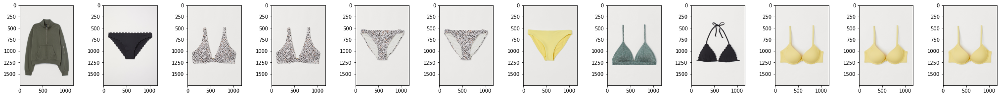

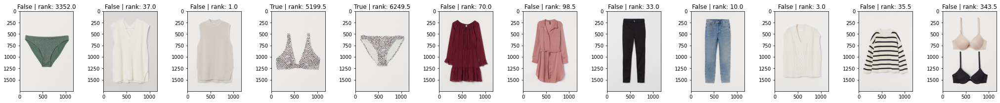

2 [78503 92159 92158 96382 96382 67274 67274 91841 93585 60259 60253  1469
  1469 59458 18197 40179 10520 40179] [78503, 18586, 91737, 17669, 75438, 71101, 44032, 73, 75912, 71110, 13122, 42626]


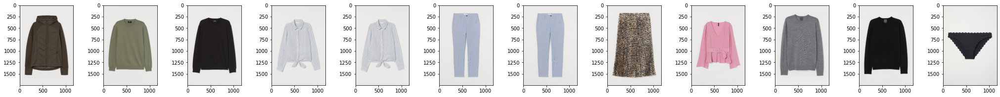

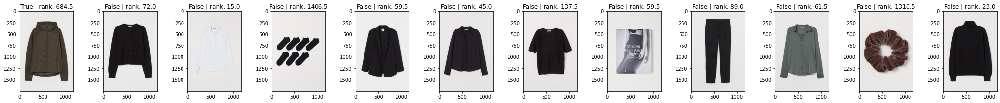

7 [82438 12783   941    74  1713 91540    75 58794  1439 41019 65820 65820
 25756 25756  1044 76935 60746  1044  1042 76293 76293 27199  7614 75726
 39035 12802 58223 54759 74946 74946 74946 56244 27196 27198  9241 65837
 18295 36760 67993 16929 44887 40796 54724 40396 39069 48589 37842 48588
 30534 40161 38376 24790 49428 49428 42080 23565 15372 53275 42441  2720
 30531 33465 40324 34906 32769 32769 48857 32310 30514 43838  3003 35012
 30751 24535 45193 14390 43773 43774 34907 45325 24533 53342 44910 59613
 40796 32309  4168  1487 38043 40880 40881  2549 46671   630 19316 11914
  3723 15608 28404 15609 26317 18913 31735 35987 12290 18192 16617 20783
 20782  1425  9048 15608 23448  8427  6700  6386 46302 46305 46304  6387] [1713, 74, 75, 104072, 95499, 104553, 103796, 94912, 104045, 25068, 95430, 56694]


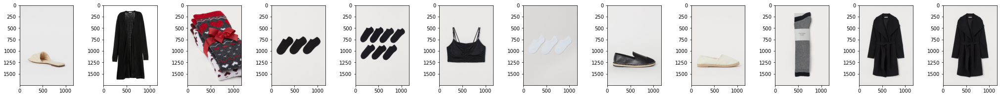

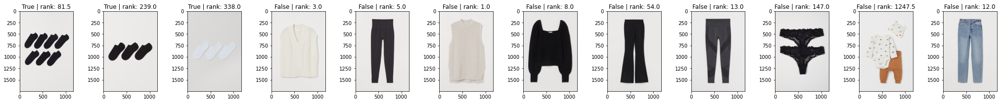

47 [67539 67540 67522 75438 75443 83343 22664 70976 70099 92935 79406 79407
 77272 45872 76252 33867 54561 73135 75666 62198 70221 70221 64911 70220
 70221 49915  7725 52142 38169 38169 41253 46595 69184 43674 38436 45879
 10530 10524 19013 19013 31710 53098 40345] [67522, 67539, 75438, 67540, 78548, 66518, 53892, 99655, 69118, 25068, 94912, 80813]


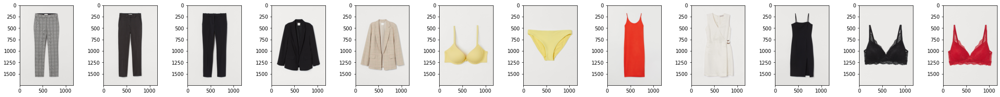

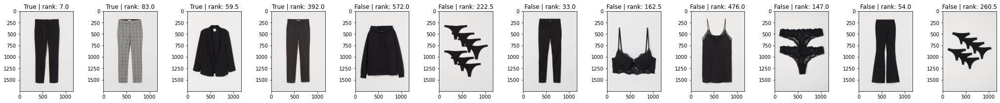

81 [79840 78388 70348 75912  3575  2863 18596 14083 18590 20916 10780  6057
 33962] [79840, 104072, 75912, 104553, 67522, 103796, 104554, 101374, 53894, 96385, 18586, 103793]


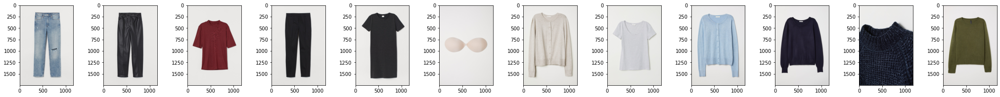

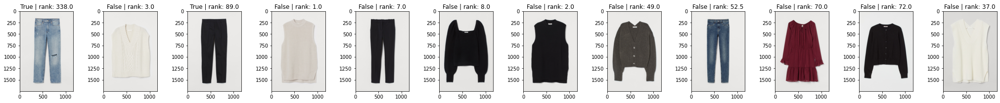

83 [51700 53096] [96385, 75438, 17155, 67522, 94674, 17163, 104072, 75912, 103795, 67543, 94673, 99023]


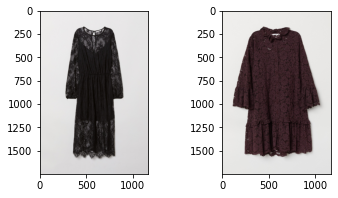

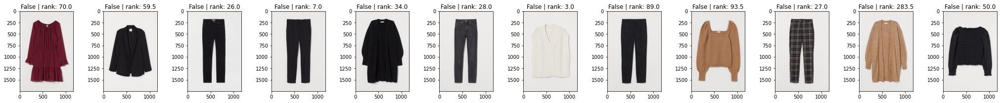

91 [48032 44549 30741 53385 41175 37991 31223 25827 43027  5446  1349 38596
 29470] [104072, 104553, 94656, 101374, 101718, 103796, 103797, 91737, 95251, 100938, 103422, 103793]


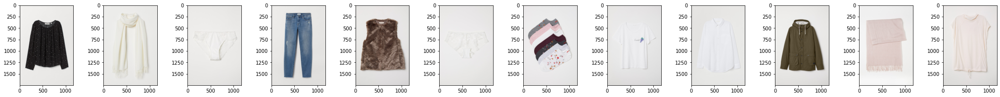

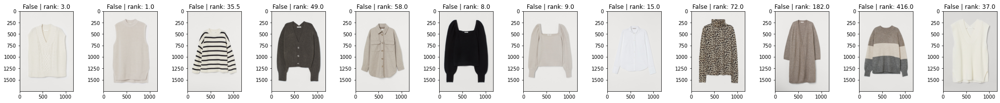

150 [96393 96393 28967 83931 83202 81605 48050 98101 17043 84482 77096 80618
 75226 75226 16087 16087 74607 74542 74002 74002 74406 77523 77523 47313
 67527 67527 47312 74402 47318 80858 80858 62868 74367 74367 49857 49857
 67944 47313 74980 74980 41523 65200 66497 55387 13272 47570 66502 49876
 49876 29184 48794 44639 29092 26030 26030 41022 41021 41025 37104] [84482, 67522, 17043, 104072, 74002, 103796, 56694, 47313, 42626, 103794, 103703, 100937]


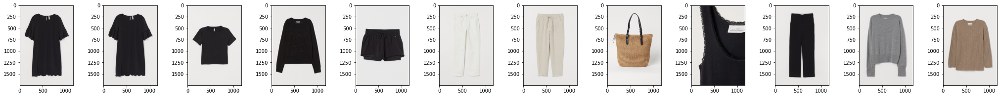

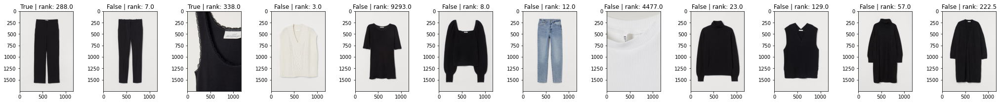

162 [44771 38276 38276  3407  3407 38277 38277 51145 51064 51064 52418 52418
 50259  5552  5552 40933 53323 34595 39367 38301 38301 42875 43767 16751
 42249 36419 36419 18257  6054 39645 20460 20460] [96834, 64637, 78548, 102649, 60792, 103479, 21518, 53892, 42626, 81240, 100647, 898]


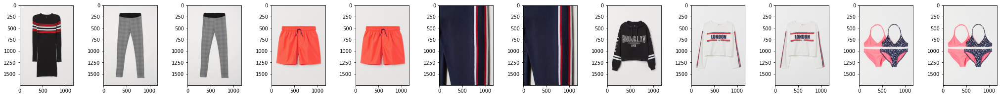

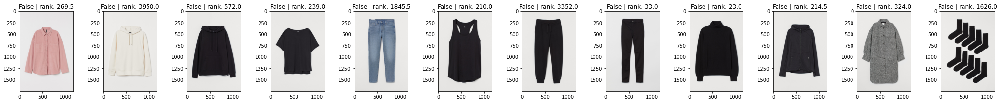

163 [60327 54581 57599  7081 88287 88287 80694 80694 62508 83606  7082 99926
 91853 50204 16494 16494 71254 85345 68268 39886 77246 73654 75914 83338
 55998 26740 43448 42733 40308 38398 47699 16453 16494 52873 12530 27385
 47748 30732 60304 51851 59149 22641 20614 22644 45836 62564 62564 47296
 19926 19704 47747  9173 19931 19930 67995 67995 59965 66096 15569 55130
 15570 52209 32259  6644 33508 37109  6302  8649 33508 29934  6641  6658
 47412 58120 39884 43251  7749 47013 42087 42087  6660   141   141 39830
 42083  8647 55705] [60327, 54581, 16494, 104072, 104553, 103796, 91737, 75438, 67522, 16453, 42626, 3520]


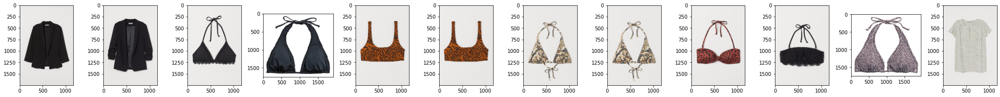

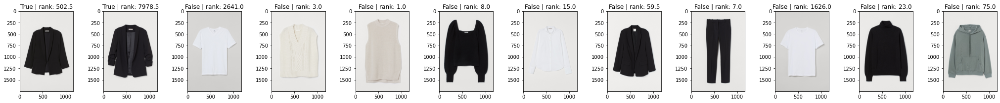

168 [98709 58510 58510 58510  3775 20909 46305] [104072, 99655, 78548, 73, 4745, 69749, 59432, 25068, 80813, 71571, 95430, 58376]


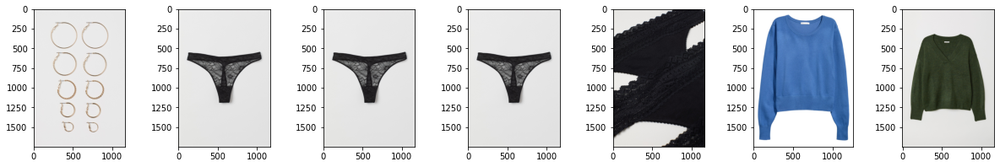

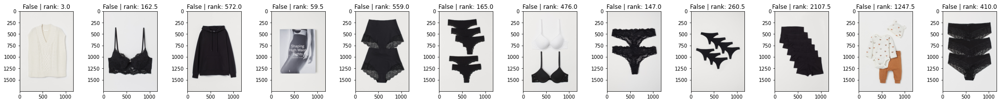

179 [ 79840   3091 105277 102857 105306 104033   4745 103797 105103 103796
  95784     73  98409 102397 105180   3510  95216 104986  81824  81824
  81824  81824  86547 100264  84974  81825 101570 103433  79814  58491
  87283  87278  86928  90619  93381  98781  88275  82438  98768  94279
  81734  82170  88142  66892  86407  74274  79151  87171  87666  87666
  74628  81385   3091  79798  60450  61302  95952  90506  56694  88143
  87172  71261  56065  79912  20591  61632  16420  16420  16420  22923
  50411  58520  55858   9124  39898  46304  43337] [73, 3091, 95784, 79840, 105103, 105277, 3510, 105306, 95216, 103796, 4745, 102397]


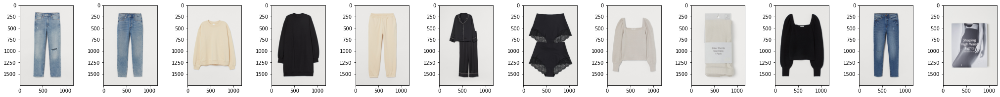

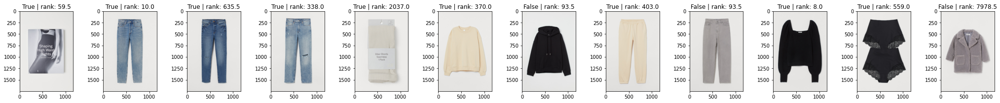

198 [75996 42950 57191 45349 43170 45350 52987 59435 49724  6946 46867 46867
 13729 22923 22923 34539 13763 46865 46867 13729 22636 15967 47415 47423
 22540  5944 47416] [104072, 103793, 94656, 104553, 78548, 73, 94674, 103796, 101374, 71110, 75438, 79032]


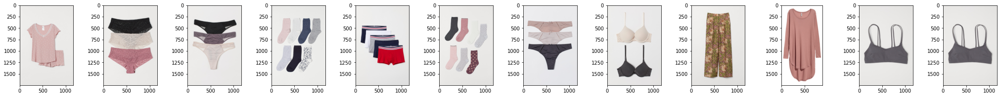

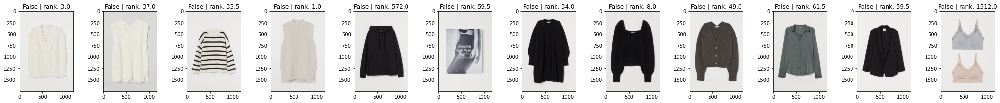

203 [100937  95866  82384  74739  94180  97017  93380  18504  97440  91749
  83622  87664  83622  92050  85004  93054  85003  43181   9116  48805
  16596  16594  16596  44194  36312  70949  62487  44194  77353  74448
  78964  77221  62759  76457   7663  23732   7638  16593  16595  52922
  46109  52918  56000  53768  50600   9992  45965   3042  46911  14296
   9145  35144   9993  32506  61071   1488  14152   5459  39897   9116
   9226] [100937, 16594, 95866, 104553, 104072, 74739, 103796, 67522, 103797, 104554, 78964, 101374]


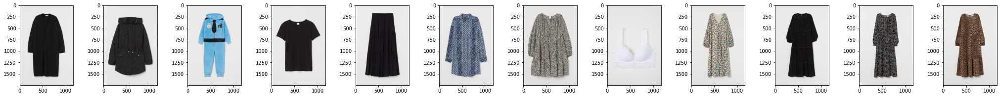

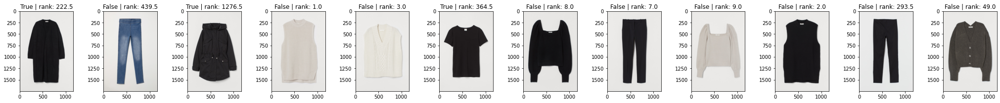

216 [94973 14254 97152 71997 71997 43552 17188 17186 36735 43345 35997 26538] [105444, 67522, 101893, 14254, 103108, 84389, 67543, 67539, 17155, 101894, 14253, 104951]


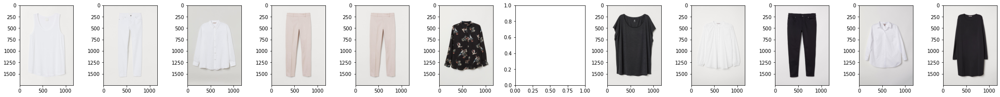

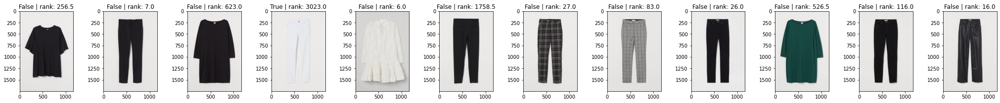

235 [102303  91975  57638  95878  78964  53894  53892  53893  66520  60342
  48907  48907  64843  61361  20434   1780  40099  24089  69760  56179
  69763  69763  69763  69761  69759  69759  69759  52192  52192   1780
   1780  12403  12403  44657  44657  40417  40417  34132  34132  48549
  48549  44655  44655  46303  46303  43407  43407  44469  31362  31362
  31362  31362  42082  42082  42957   6066   6066] [53892, 53894, 53893, 104072, 95499, 104553, 56694, 94912, 97518, 78964, 3091, 103703]


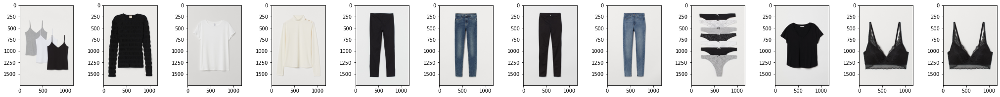

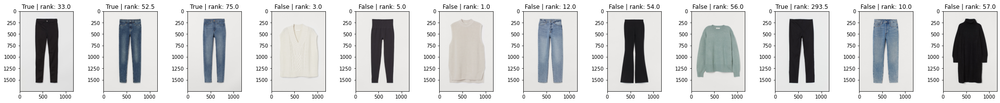

238 [ 71701 102412 104073 102762 103421  67899  94440  87394   8484  82704
  61271   2785   9680  41075  41065  42019   9336  39618  36269  44751
   9679   9680] [67899, 71701, 103421, 104073, 102762, 102412, 68615, 8484, 68614, 79032, 95430, 73]


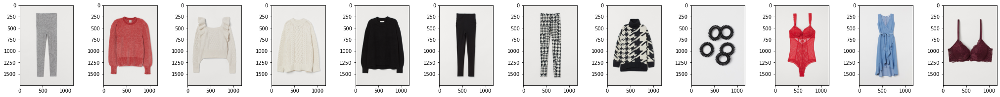

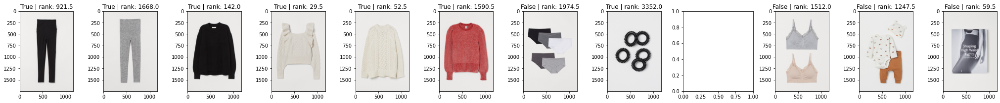

255 [41183] [75438, 78503, 94674, 16003, 104072, 97559, 99398, 103047, 94700, 101729, 104259, 98237]


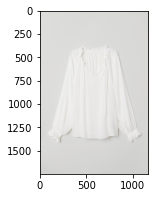

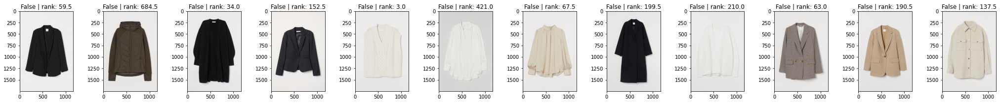

263 [78509 65630 38560  2200 80444 67748 67748 56437 56500 54480 54480 54480
 63548 73737  6458  3946 75525 10111 15137 75522 65749 67052 58771 63386
  7645  7647  7638 43599  4015 41783   506 34396] [6458, 104072, 104553, 4015, 97518, 67522, 95251, 95256, 67543, 94656, 103796, 67539]


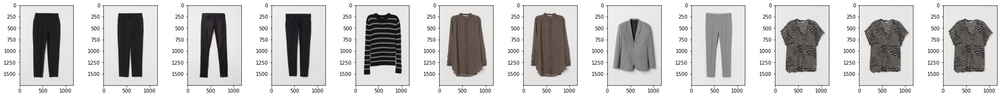

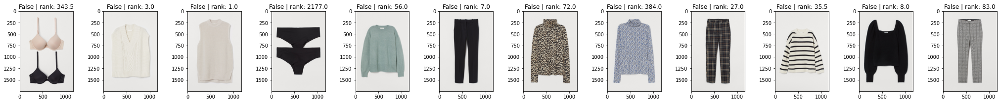

267 [22658 90713 45801 92573 56656 85118 58769 58275 52986 36717] [104072, 103108, 22658, 104553, 103793, 94656, 101374, 90713, 103796, 102762, 103797, 101375]


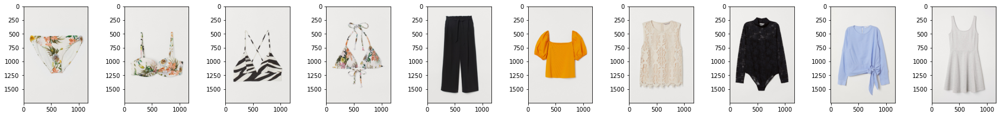

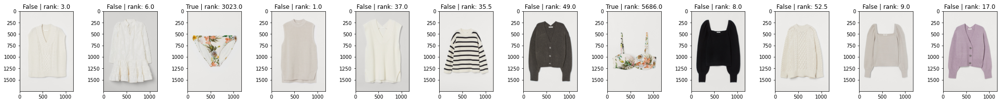

275 [73945 71627 62754  3509 62755 59405 79811 71643 81826  9055 57400  2118
  9066 12726 56673 67208 45746 40931 26967     9  8486   371  2633 27819
 13743 34071 40902 45941 15988 13275 12662] [2633, 9, 68614, 95430, 12726, 68615, 93438, 13338, 85336, 25068, 58376, 59432]


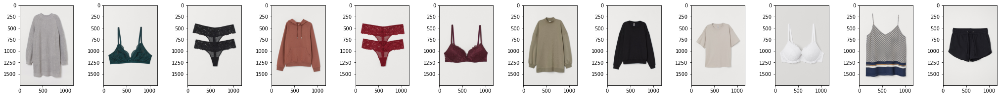

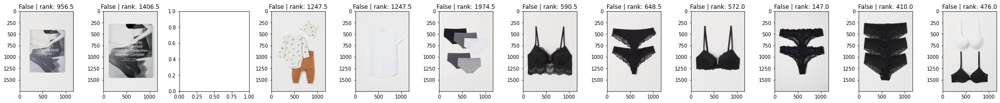

In [33]:
articles = pd.read_csv(INPUT_DIR / "articles.csv", dtype={'article_id': str}) 
image_dir = '../input/h-and-m-personalized-fashion-recommendations/images'
articles["file_path"] = articles["article_id"].apply(lambda x:f"{image_dir}/{x[:3]}/{x}.jpg")

nn_num = 12

u_idx = 0
u_num = 20
for cid, preds in c_preds.items():

    c_aids = trans[trans.customer_id==cid].article_id.values[::-1]
    print(cid, c_aids, preds[:12])

    c_nn_num = min(len(c_aids), nn_num)
    prev_nn_idx = [id2artcle[i] for i in c_aids[:c_nn_num]]
    plt.figure(figsize=(c_nn_num * 3, 3))
    row, col = c_nn_num, 1
    for i in range(row * col):
        plt.subplot(col, row, i + 1)
        file_path = articles.loc[articles["article_id"]==prev_nn_idx[i], "file_path"].values[0]
        try:
            image = cv2.imread(file_path)[:,:,::-1]
        except:
            continue
        plt.imshow(image)
    plt.show()
    
    nn_idx = [id2artcle[i] for i in preds[:nn_num]]
    nn_rank = [week_pupular_dict[1][i] if i in week_pupular_dict[1] else None for i in preds[:nn_num]]
    plt.figure(figsize=(nn_num * 3, 3))
    row, col = nn_num, 1
    for i in range(row * col):
        plt.subplot(col, row, i + 1)
        file_path = articles.loc[articles["article_id"]==nn_idx[i], "file_path"].values[0]
        try:
            image = cv2.imread(file_path)[:,:,::-1]
        except:
            continue
        plt.title(f"{nn_idx[i] in prev_nn_idx} | rank: {nn_rank[i]}")
        plt.imshow(image)
    plt.show()

    u_idx += 1
    if u_idx > u_num: break

In [35]:
week1_pupular = [id2artcle[aid] for aid in week_pupular_list[1][:12]]
week1_pupular

['0924243001',
 '0924243002',
 '0918522001',
 '0923758001',
 '0866731001',
 '0909370001',
 '0751471001',
 '0915529003',
 '0915529005',
 '0448509014',
 '0762846027',
 '0714790020']

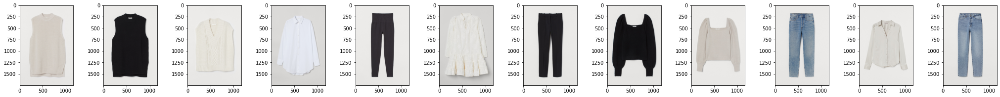

In [36]:
nn_num = 12
nn_idx = [id2artcle[i] for i in week_pupular_list[1][:nn_num]]
plt.figure(figsize=(nn_num * 3, 3))
row, col = nn_num, 1
for i in range(row * col):
    plt.subplot(col, row, i + 1)
    file_path = articles.loc[articles["article_id"]==nn_idx[i], "file_path"].values[0]
    try:
        image = cv2.imread(file_path)[:,:,::-1]
    except:
        continue
    plt.imshow(image)
plt.show()

In [37]:
sub = pd.read_csv('../input/h-and-m-personalized-fashion-recommendations/sample_submission.csv')

In [39]:
%%time

preds = []
for c_id in tqdm(sub.customer_id):
    cid = customer2id[c_id]
    if cid in c_preds:
        ps = [id2artcle[aid] for aid in c_preds[cid][:12]]
        preds.append(ps)
    else:
        preds.append(week1_pupular)

preds = [' '.join(ps) for ps in preds]
sub.prediction = preds

cv = 0.033436553317243475
sub_name = 'rank_gbdt_v3-2'
sub.to_csv(f'../sub/{sub_name}_{cv:.4f}.csv.gz', index=False)

  0%|          | 0/1371980 [00:00<?, ?it/s]

CPU times: user 29.8 s, sys: 205 ms, total: 30.1 s
Wall time: 30 s


In [40]:
sub

,customer_id,prediction
0,00000dbacae5abe5e23885899a1fa44253a17956c6d1c3...,0568601043 0918522001 0730570029 0924243001 09...
1,0000423b00ade91418cceaf3b26c6af3dd342b51fd051e...,0599580055 0915526001 0924243001 0811925005 08...
2,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,0794321007 0579541001 0850917001 0575347003 07...
3,00005ca1c9ed5f5146b52ac8639a40ca9d57aeff4d1bd2...,0866731001 0918292001 0803685001 0905957001 08...
4,00006413d8573cd20ed7128e53b7b13819fe5cfc2d801f...,0730683050 0818320001 0896152002 0791587015 06...
...,...,...
1371975,ffffbbf78b6eaac697a8a5dfbfd2bfa8113ee5b403e474...,0720125039 0791587007 0804992033 0557599022 07...
1371976,ffffcd5046a6143d29a04fb8c424ce494a76e5cdf4fab5...,0706016015 0762846031 0874110002 0714790020 08...
1371977,ffffcf35913a0bee60e8741cb2b4e78b8a98ee5ff2e6a1...,0762846027 0884081001 0689365050 0794819001 07...
1371978,ffffd7744cebcf3aca44ae7049d2a94b87074c3d4ffe38...,0714790020 0714790024 0918522001 0874110002 07...
